# Objective 1: Dataset Collection

In [1]:
import os
import random
import shutil
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import exifread
import os
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

In [2]:
# Define the paths to your dataset directories
dataset_dir = "D:/Fraud Final Project/Fake Face Detection/real_and_fake_face"
training_fake_dir = os.path.join(dataset_dir, "training_fake")
training_real_dir = os.path.join(dataset_dir, "training_real")
validation_fake_dir = os.path.join(dataset_dir, "validation_fake")
validation_real_dir = os.path.join(dataset_dir, "validation_real")

In [3]:
# Define the split ratio (e.g., 80% for training, 20% for validation)
split_ratio = 0.2  # 20% for validation

In [4]:
# List the files in the training directories
fake_image_files = os.listdir(training_fake_dir)
real_image_files = os.listdir(training_real_dir)

In [5]:
# Shuffle the image files
random.shuffle(fake_image_files)
random.shuffle(real_image_files)

In [6]:
# Calculate the number of images to move to validation set
num_fake_validation = int(len(fake_image_files) * split_ratio)
num_real_validation = int(len(real_image_files) * split_ratio)

print(num_fake_validation)
print(num_real_validation)

4
4


In [7]:
# Move images to validation directories
for i in range(num_fake_validation):
    source_path = os.path.join(training_fake_dir, fake_image_files[i])
    destination_path = os.path.join(validation_fake_dir, fake_image_files[i])
    shutil.move(source_path, destination_path)

In [8]:
for i in range(num_real_validation):
    source_path = os.path.join(training_real_dir, real_image_files[i])
    destination_path = os.path.join(validation_real_dir, real_image_files[i])
    shutil.move(source_path, destination_path)

In [9]:
print("Dataset organization into training and validation sets completed.")

Dataset organization into training and validation sets completed.


# Objective 2: Feature Extraction

In [10]:
# Function to extract HOG and color histogram features from an image
def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (128, 128))  # Resize image to a fixed size

    # Extract HOG features
    hog = cv2.HOGDescriptor()
    hog_features = hog.compute(image)
    hog_features = hog_features.flatten()

    # Extract color histogram features
    color_histogram = cv2.calcHist([image], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    color_histogram = cv2.normalize(color_histogram, color_histogram).flatten()

    # Combine HOG and color histogram features
    features = np.concatenate((hog_features, color_histogram))
    
    return features

In [11]:
# Example usage:
fake_image_files = os.listdir(training_fake_dir)
real_image_files = os.listdir(training_real_dir)

In [12]:
fake_features = []
real_features = []

In [13]:
# Extract features for fake images
for fake_image_file in fake_image_files:
    image_path = os.path.join(training_fake_dir, fake_image_file)
    features = extract_features(image_path)
    fake_features.append(features)

In [14]:
print(fake_features)

[array([0.2251657 , 0.05692234, 0.02956812, ..., 0.        , 0.00073905,
       0.00665142], dtype=float32), array([0.2527734 , 0.25537583, 0.25537583, ..., 0.        , 0.03939591,
       0.11818773], dtype=float32), array([0.15202509, 0.10736896, 0.13780308, ..., 0.        , 0.        ,
       0.01706297], dtype=float32), array([0.11170103, 0.14486001, 0.10962592, ..., 0.        , 0.        ,
       0.00527904], dtype=float32), array([0.10617771, 0.14972469, 0.13164377, ..., 0.        , 0.00171313,
       0.14618725], dtype=float32), array([0.12622032, 0.26243398, 0.27524692, ..., 0.        , 0.00049442,
       0.00173046], dtype=float32), array([0.08227246, 0.05547975, 0.03924173, ..., 0.        , 0.00675323,
       0.7584845 ], dtype=float32), array([0.11674096, 0.03364151, 0.00909808, ..., 0.        , 0.03527752,
       0.10617176], dtype=float32), array([0.10117173, 0.20821267, 0.26183212, ..., 0.00683657, 0.03418286,
       0.22249936], dtype=float32), array([0.18868282, 0.290261

In [15]:
# Extract features for real images
for real_image_file in real_image_files:
    image_path = os.path.join(training_real_dir, real_image_file)
    features = extract_features(image_path)
    real_features.append(features)

In [16]:
print(real_features)

[array([0.0177408 , 0.31021917, 0.31021917, ..., 0.        , 0.        ,
       0.        ], dtype=float32), array([0.00805339, 0.02634278, 0.05910193, ..., 0.        , 0.        ,
       0.00263855], dtype=float32), array([0.03272804, 0.05949224, 0.05376819, ..., 0.        , 0.        ,
       0.00305382], dtype=float32), array([0.33452734, 0.05958831, 0.01596551, ..., 0.        , 0.        ,
       0.00099795], dtype=float32), array([0.18240252, 0.2109118 , 0.16687249, ..., 0.        , 0.        ,
       0.1233002 ], dtype=float32), array([0.14941074, 0.32795927, 0.22784771, ..., 0.09002551, 0.0507926 ,
       0.05814877], dtype=float32), array([0.05918039, 0.04379027, 0.31783947, ..., 0.        , 0.00592689,
       0.11967763], dtype=float32), array([0.1270958 , 0.10484273, 0.12647946, ..., 0.        , 0.00122773,
       0.00266008], dtype=float32), array([8.42921287e-02, 2.05313712e-01, 1.17419071e-01, ...,
       0.00000000e+00, 1.58724535e-04, 1.15868915e-02], dtype=float32), arr

# Noise and Face Detection Analysis

In [17]:
# Function to extract noise features from an image and display the result
def extract_noise_features(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    # Apply a denoising filter (Gaussian or median filter)
    denoised_image = cv2.GaussianBlur(image, (3, 3), 0)
    noise_features = np.abs(image - denoised_image).flatten()

    # Display the original image, denoised image, and the noise
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    
    plt.subplot(1, 3, 2)
    plt.imshow(denoised_image, cmap='gray')
    plt.title('Denoised Image')

    plt.subplot(1, 3, 3)
    plt.imshow(noise_features.reshape(image.shape), cmap='hot', interpolation='nearest')
    plt.title('Noise')
    
    plt.show()


In [18]:
# Function to extract the number of faces detected in an image and display the result
def extract_face_features(image_path):
    image = cv2.imread(image_path)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    num_faces = len(faces)
    
    # Draw rectangles around detected faces
    for (x, y, w, h) in faces:
        cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Display the image with detected faces
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f'Number of Faces: {num_faces}')
    plt.show()

In [19]:
# Example usage: Extract and display features for four specific images
selected_fake_images = [os.path.join(training_fake_dir, fake_image_files[i]) for i in range(4)]
selected_real_images = [os.path.join(training_real_dir, real_image_files[i]) for i in range(4)]

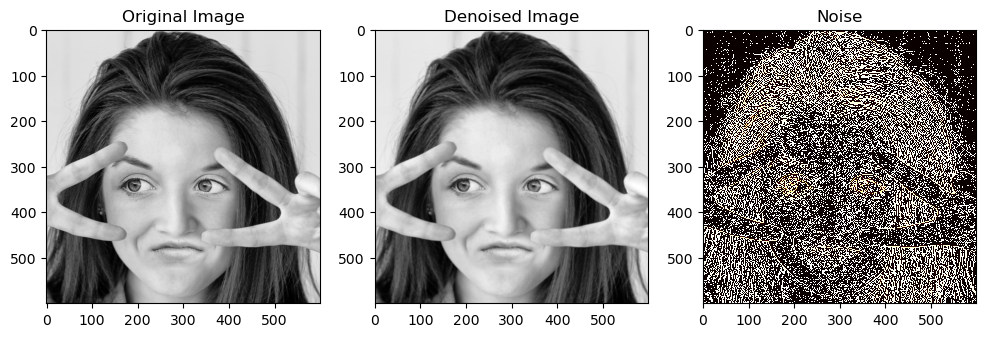

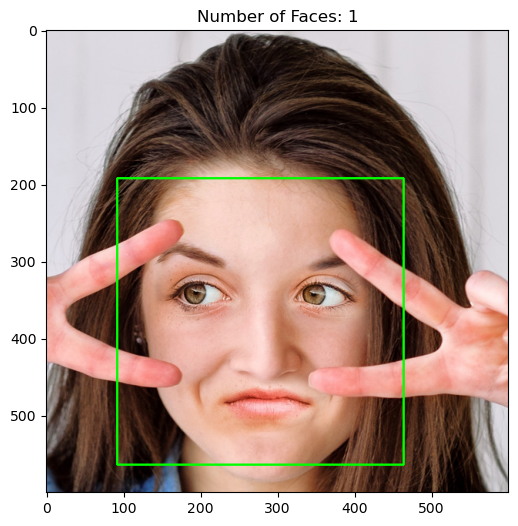

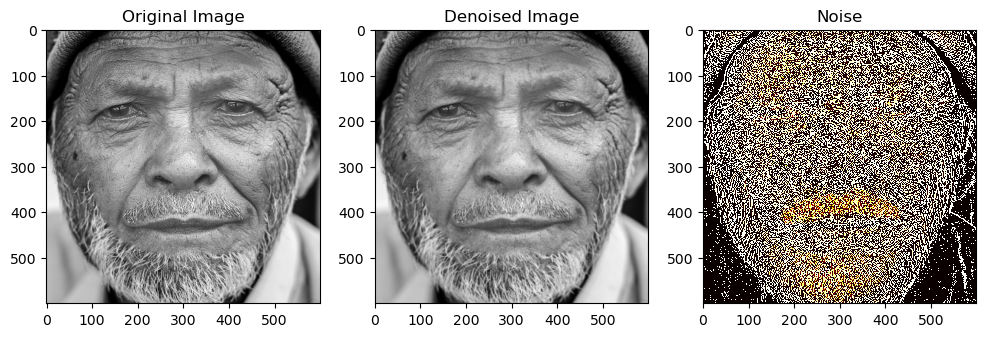

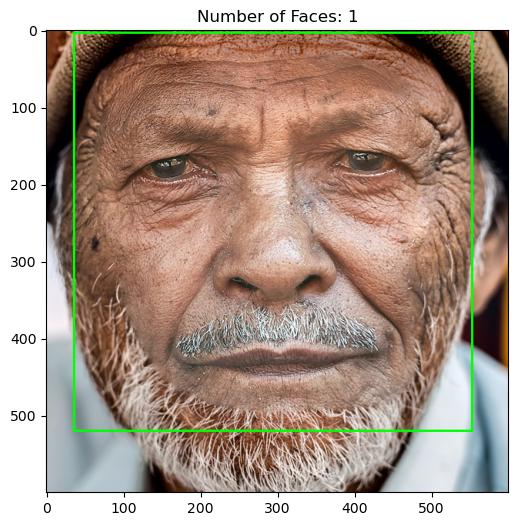

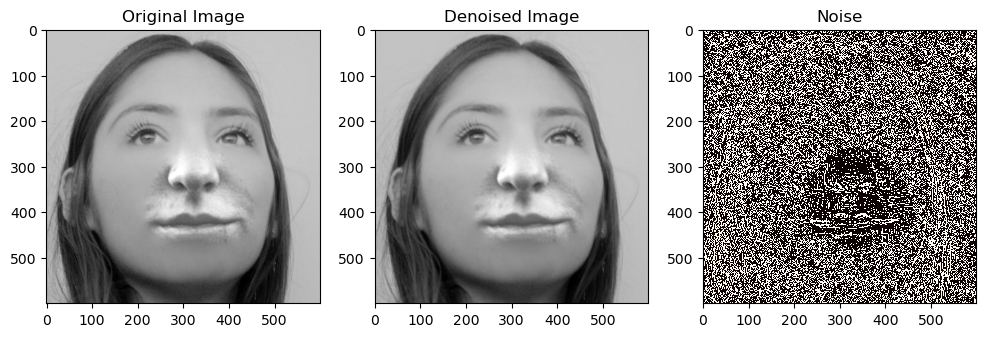

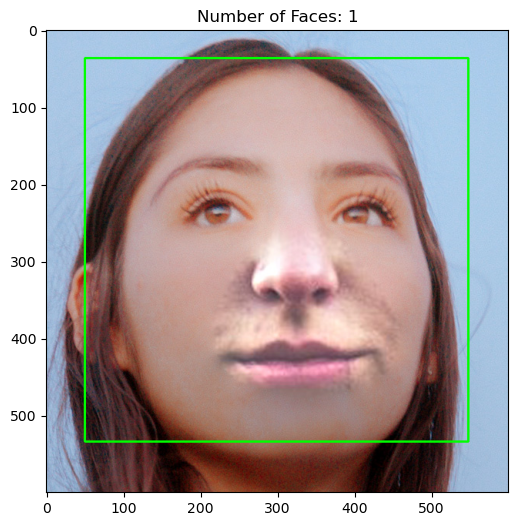

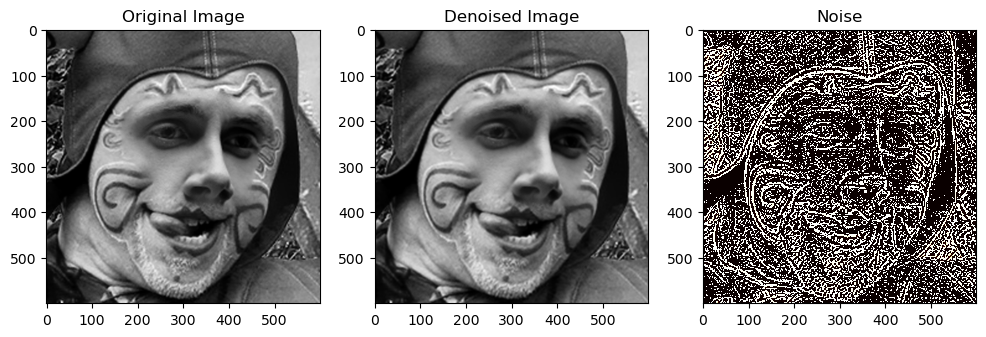

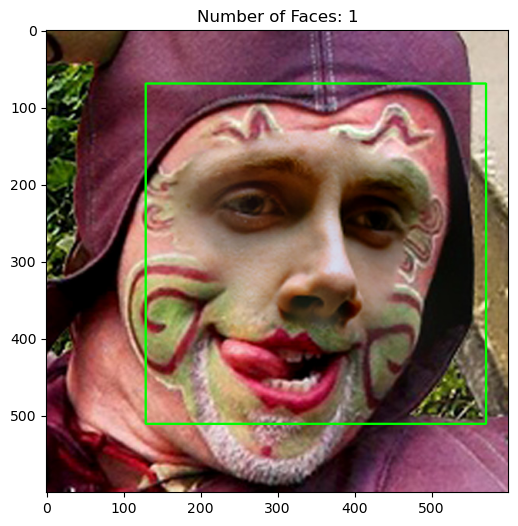

In [20]:
for fake_image_path in selected_fake_images:
    # Extract and display noise features for fake images
    extract_noise_features(fake_image_path)
    
    # Extract and display face features for fake images
    extract_face_features(fake_image_path)

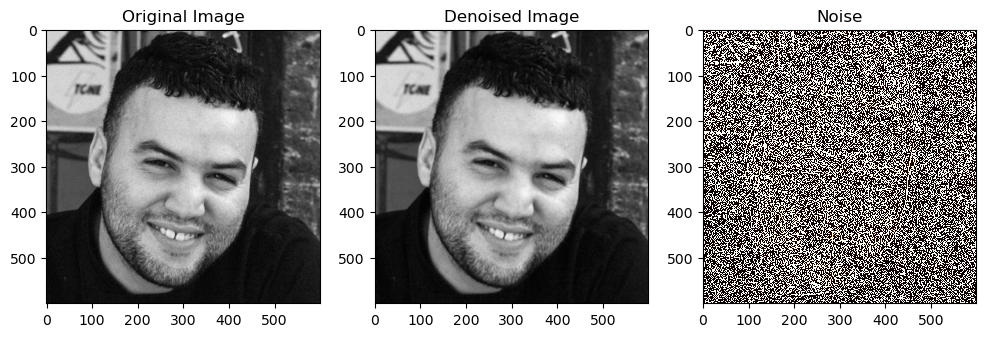

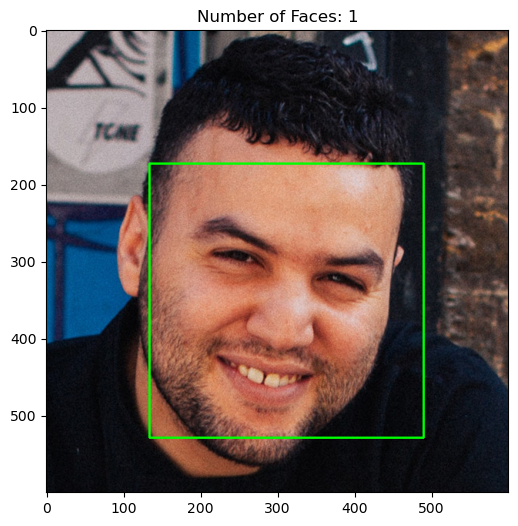

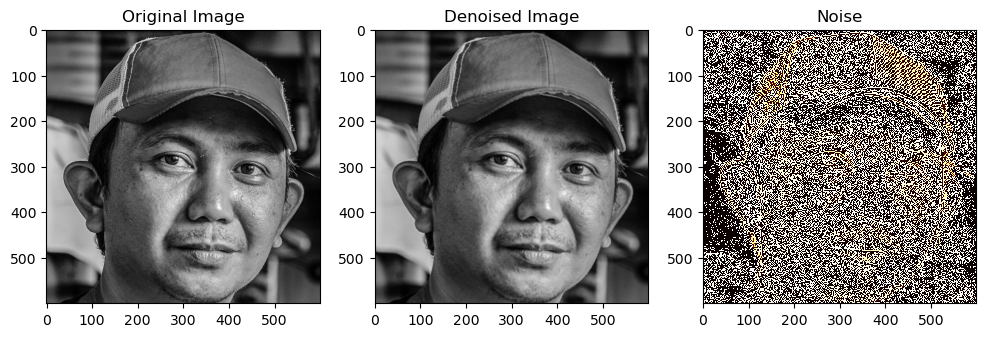

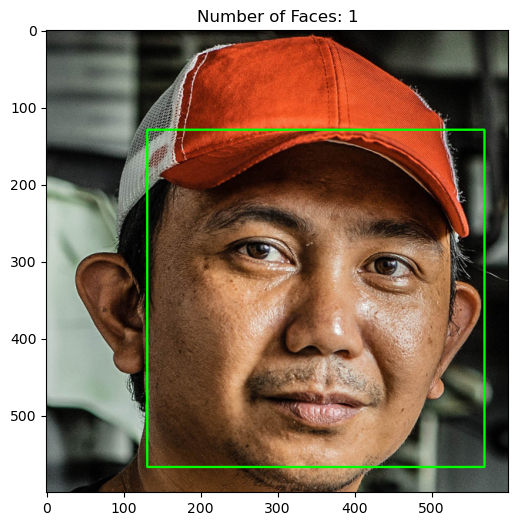

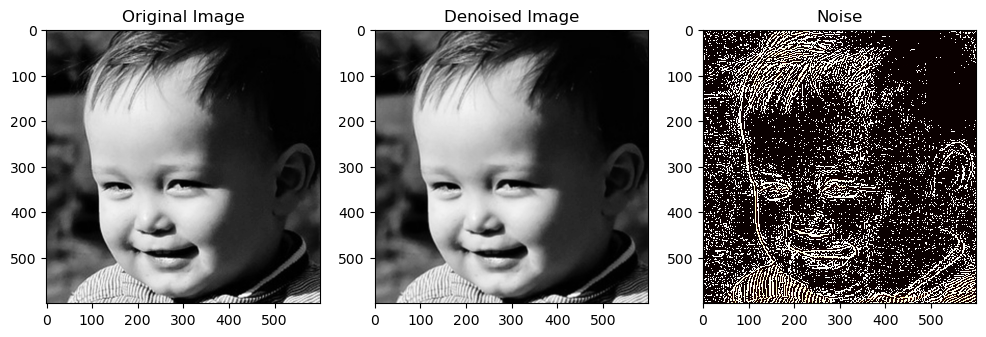

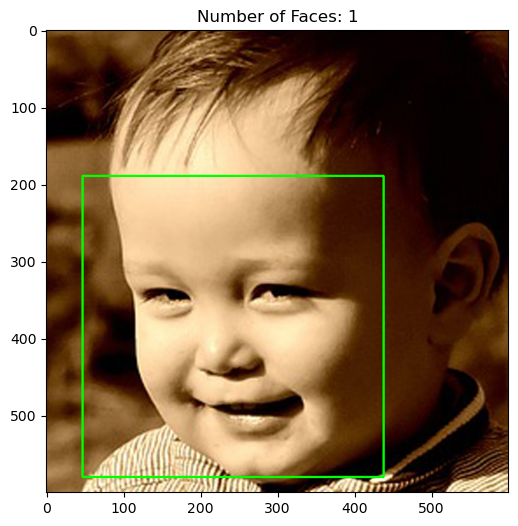

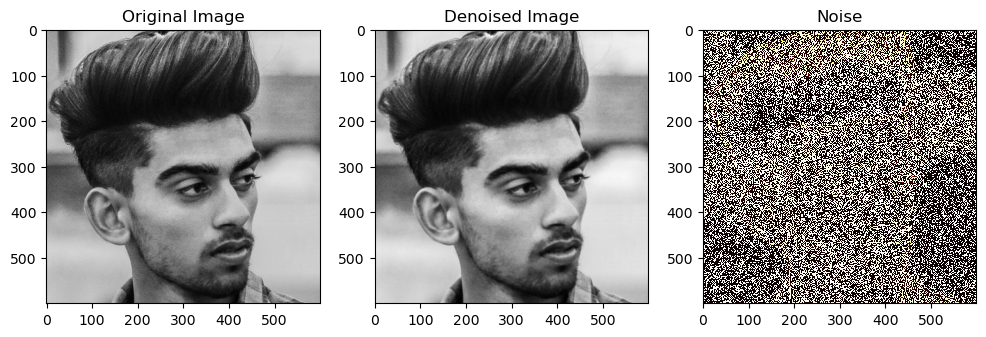

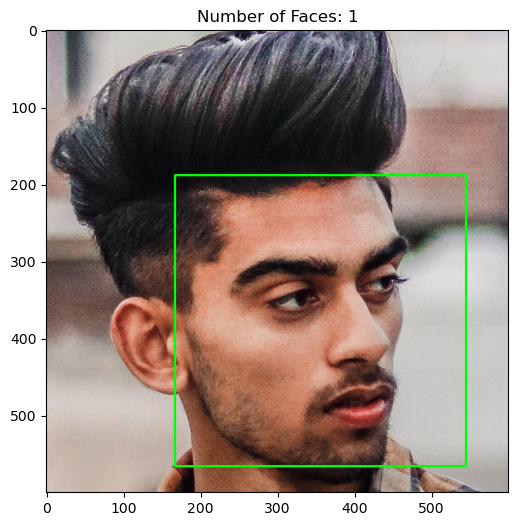

In [21]:
for real_image_path in selected_real_images:
    # Extract and display noise features for real images
    extract_noise_features(real_image_path)
    
    # Extract and display face features for real images
    extract_face_features(real_image_path)

# Histogram Based Feature Extraction

In [22]:
# Function to extract histogram-based features from an image and display the result
def extract_histogram_features(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Calculate the histogram of pixel intensities
    histogram = cv2.calcHist([image], [0], None, [256], [0, 256])
    
    # Flatten the histogram and calculate features
    histogram = histogram.flatten()
    mean_intensity = np.mean(histogram)
    variance_intensity = np.var(histogram)
    skewness_intensity = np.mean((histogram - mean_intensity) ** 3) / (variance_intensity ** (3/2))
    kurtosis_intensity = np.mean((histogram - mean_intensity) ** 4) / (variance_intensity ** 2)
    
    # Display the histogram and calculated features
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.hist(histogram, bins=256, range=(0, 256), density=True, color='gray', alpha=0.7)
    plt.title('Histogram')
    
    plt.subplot(1, 2, 2)
    plt.text(0.5, 0.5, f'Mean: {mean_intensity:.2f}\nVariance: {variance_intensity:.2f}\nSkewness: {skewness_intensity:.2f}\nKurtosis: {kurtosis_intensity:.2f}',
             fontsize=12, ha='center')
    plt.axis('off')
    
    plt.show()

In [23]:
# Example usage: Extract and display histogram-based features for the first four fake and real images
selected_fake_images = [os.path.join(training_fake_dir, fake_image_files[i]) for i in range(4)]
selected_real_images = [os.path.join(training_real_dir, real_image_files[i]) for i in range(4)]

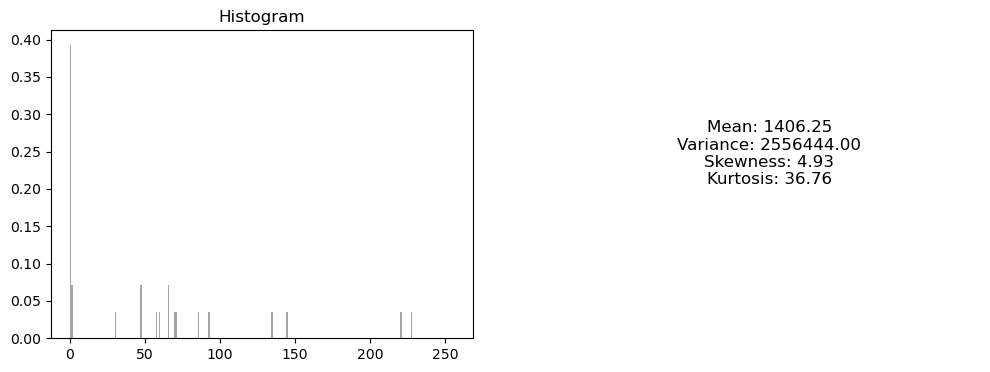

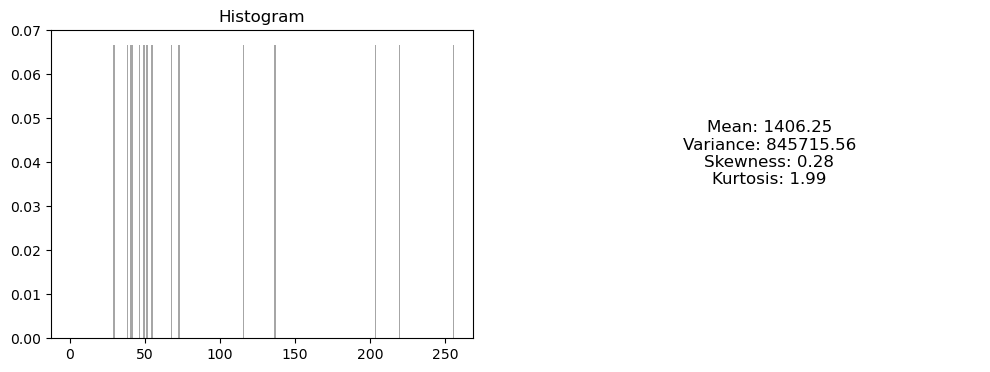

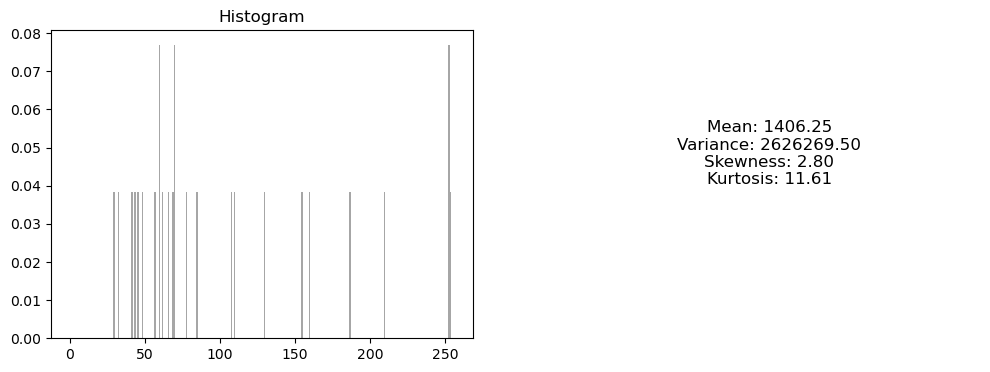

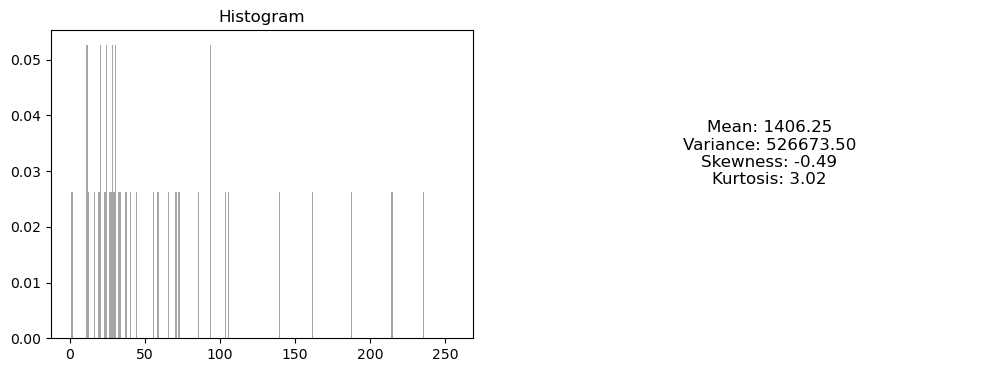

In [24]:
for fake_image_path in selected_fake_images:
    extract_histogram_features(fake_image_path)

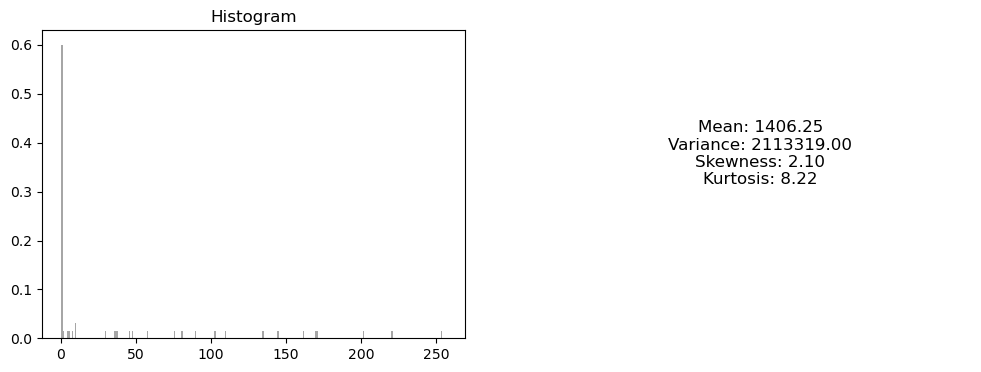

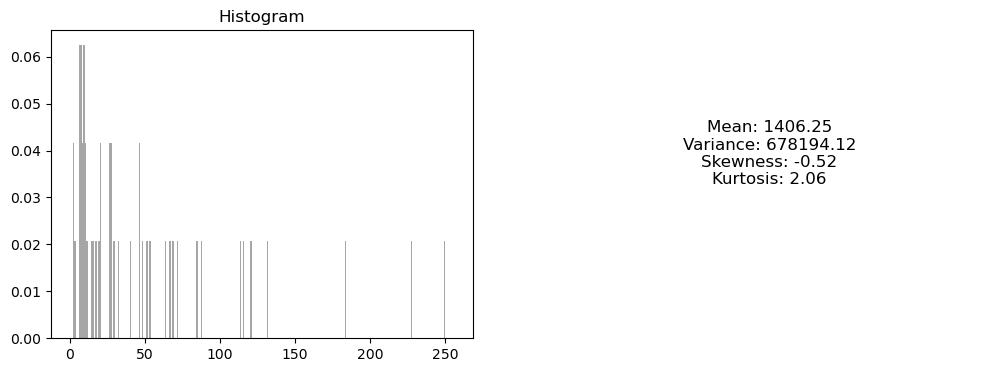

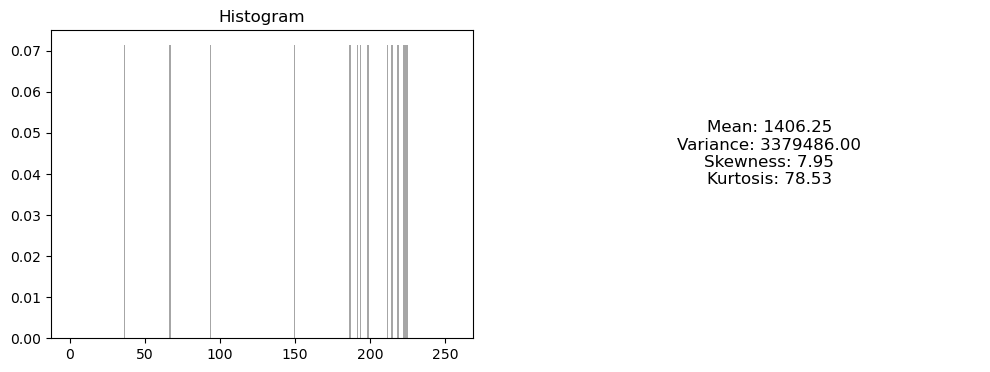

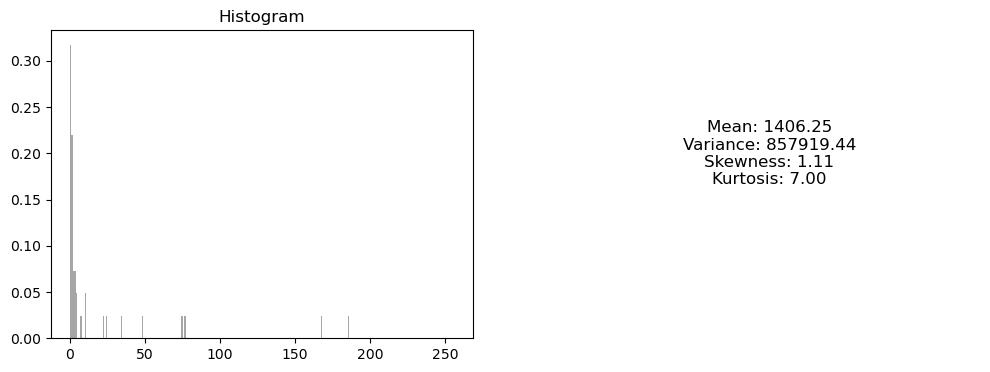

In [25]:
for real_image_path in selected_real_images:
    extract_histogram_features(real_image_path)

In [26]:
# Function to extract and display SIFT features from an image
def extract_sift_features(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Initialize the SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect SIFT keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(image, None)
    
    # Visualize SIFT keypoints on the image
    img_with_keypoints = cv2.drawKeypoints(image, keypoints, None)
    
    # Display the image with keypoints
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
    plt.title('SIFT Keypoints')
    plt.axis('off')
    plt.show()

In [27]:
# Example usage: Extract and display SIFT features for two fake and two real images
selected_fake_images = [os.path.join(training_fake_dir, fake_image_files[i]) for i in range(4)]
selected_real_images = [os.path.join(training_real_dir, real_image_files[i]) for i in range(4)]

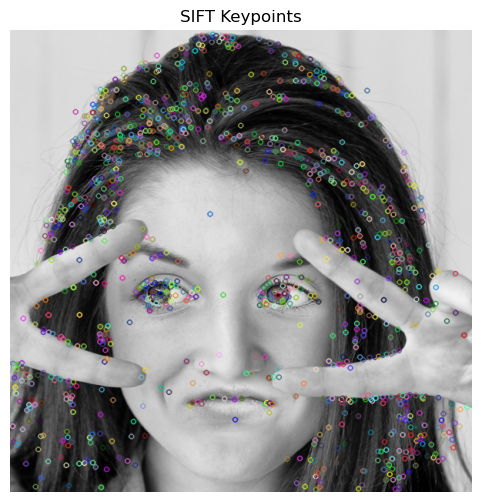

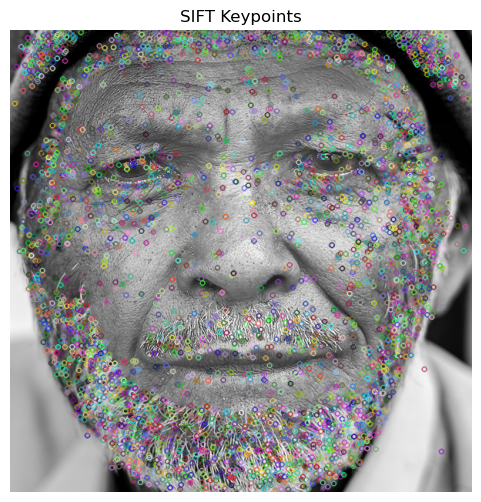

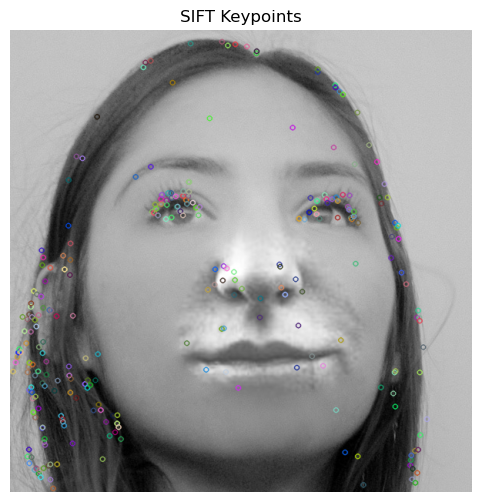

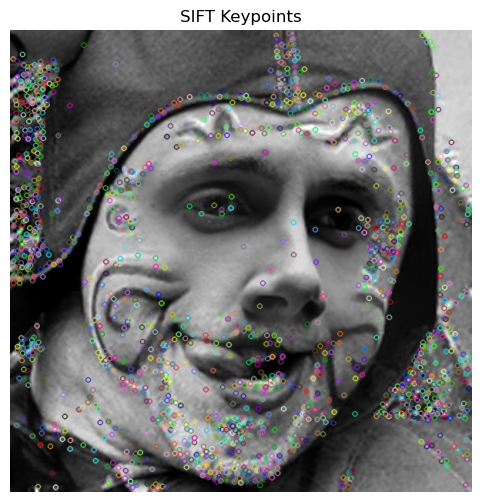

In [28]:
for fake_image_path in selected_fake_images:
    extract_sift_features(fake_image_path)


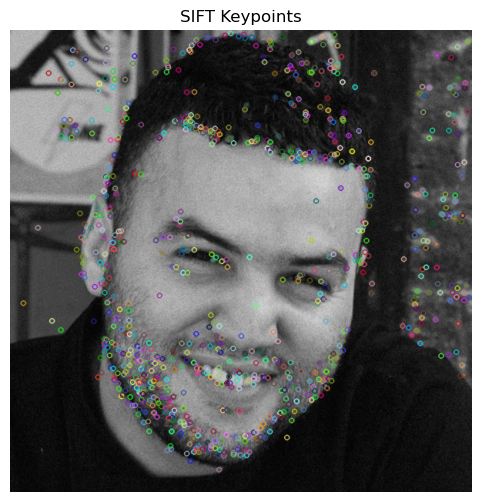

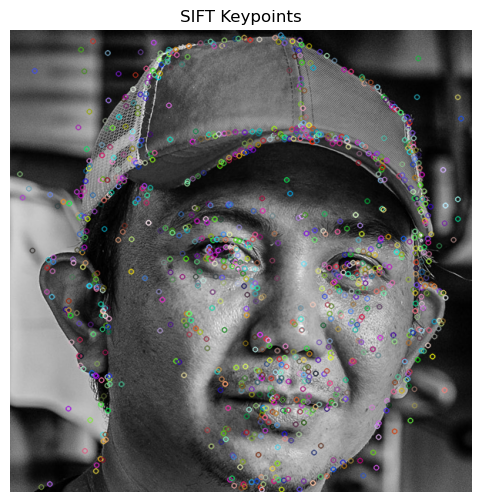

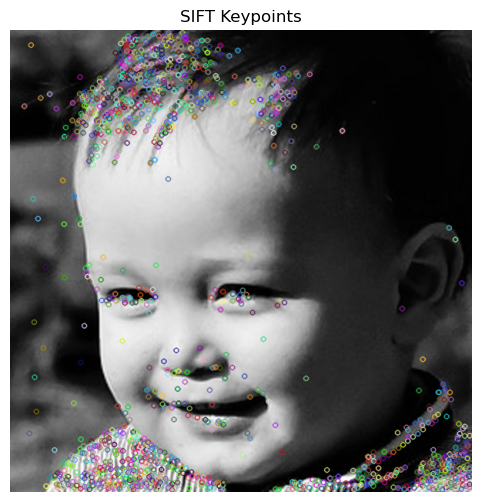

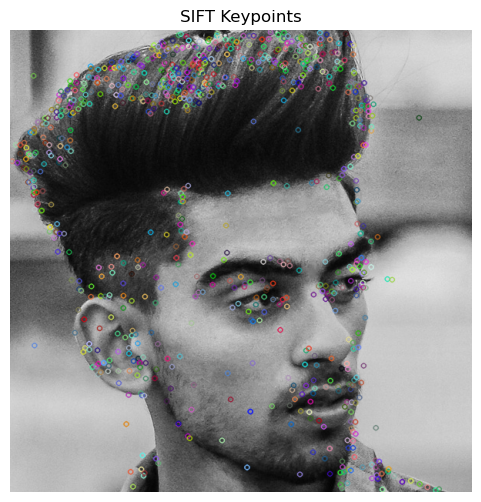

In [29]:
for real_image_path in selected_real_images:
    extract_sift_features(real_image_path)

# Objective 3: Machine Learning Models

<h3>3(1). Data Preparation</h3>

In [30]:
# Function to load and preprocess images
def load_and_preprocess_data(directory, label):
    images = []
    labels = []
    for image_file in os.listdir(directory):
        image_path = os.path.join(directory, image_file)
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224, 224))  # Resize to a consistent size (adjust as needed)
        image = image / 255.0  # Normalize pixel values to [0, 1]
        images.append(image)
        labels.append(label)
    return images, labels

In [31]:
# Load and preprocess fake and real images
fake_images, fake_labels = load_and_preprocess_data(training_fake_dir, label=0)
real_images, real_labels = load_and_preprocess_data(training_real_dir, label=1)

In [32]:
# Split data into training and validation sets
fake_images_train, fake_images_val, fake_labels_train, fake_labels_val = train_test_split(fake_images, fake_labels, test_size=0.2, random_state=42)
real_images_train, real_images_val, real_labels_train, real_labels_val = train_test_split(real_images, real_labels, test_size=0.2, random_state=42)

In [33]:
# Combine fake and real data
X_train = np.array(fake_images_train + real_images_train)
y_train = np.array(fake_labels_train + real_labels_train)
X_val = np.array(fake_images_val + real_images_val)
y_val = np.array(fake_labels_val + real_labels_val)

In [34]:
# Convert labels to one-hot encoding
y_train = to_categorical(y_train)
y_val = to_categorical(y_val)

<h3> 3(2). Model Construction </h3>

In [99]:
from tensorflow.keras import regularizers

In [119]:
# Create a sequential model
model = Sequential()

In [120]:
# Add convolutional layers with L2 regularization
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3), kernel_regularizer=regularizers.l2(0.1)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.1)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.1)))
model.add(MaxPooling2D((2, 2)))

In [121]:
# Add fully connected layers with L2 regularization
model.add(Flatten())
model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.1)))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax', kernel_regularizer=regularizers.l2(0.1))) 

In [122]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

<h3>3(3). Model Training

In [123]:
# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/10
1/1 [==============================] - 1s 1s/step - loss: 40.1170 - accuracy: 0.5200 - val_loss: 32.4374 - val_accuracy: 0.5000
Epoch 2/10
1/1 [==============================] - 0s 118ms/step - loss: 32.6867 - accuracy: 0.6000 - val_loss: 27.7307 - val_accuracy: 0.5000
Epoch 3/10
1/1 [==============================] - 0s 108ms/step - loss: 27.3869 - accuracy: 0.5200 - val_loss: 21.6529 - val_accuracy: 0.5000
Epoch 4/10
1/1 [==============================] - 0s 107ms/step - loss: 21.5228 - accuracy: 0.6800 - val_loss: 18.3579 - val_accuracy: 0.5000
Epoch 5/10
1/1 [==============================] - 0s 103ms/step - loss: 18.2360 - accuracy: 0.6400 - val_loss: 16.0411 - val_accuracy: 0.5000
Epoch 6/10
1/1 [==============================] - 0s 100ms/step - loss: 16.0005 - accuracy: 0.5600 - val_loss: 14.5101 - val_accuracy: 0.5000
Epoch 7/10
1/1 [==============================] - 0s 98ms/step - loss: 14.4391 - accuracy: 0.8000 - val_loss: 13.6119 - val_accuracy: 0.5000
Epoch 8/10

<h3>Model Evaluation</h3>

In [124]:
# Function to load and preprocess a single image
def load_and_preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224, 224))  # Resize to a consistent size (adjust as needed)
    image = image / 255.0  # Normalize pixel values to [0, 1]
    return image

In [130]:
# Input: Provide the path to the image you want to evaluate
user_image_path = "C:/Users/SIDDHAARTH/Desktop/download.jpeg"  # Replace with the actual path to the user's image

# Load and preprocess the user's image
user_image = load_and_preprocess_image(user_image_path)

# Make a prediction using your trained model
prediction = model.predict(np.expand_dims(user_image, axis=0))

1/1 [==============================] - 0s 25ms/step


In [131]:
# Interpret the prediction
if prediction[0][0] > prediction[0][1]:
    print("The image is predicted as FAKE.")
else:
    print("The image is predicted as REAL.")

The image is predicted as REAL.


# 4: Metadata Analysis

In [127]:
# Function to extract and analyze metadata from an image
def analyze_image_metadata(image_path):
    try:
        # Open the image using PIL
        image = Image.open(image_path)

        # Extract metadata using exifread
        with open(image_path, 'rb') as image_file:
            tags = exifread.process_file(image_file)

        # Extract and analyze relevant metadata attributes
        creation_date = tags.get('EXIF DateTimeOriginal', 'Not available')
        software_used = tags.get('Image Software', 'Not available')
        manipulation_history = tags.get('Image ImageHistory', 'Not available')

        # Print the extracted metadata attributes
        print("Image Path:", image_path)
        print("Creation Date:", creation_date)
        print("Software Used:", software_used)
        print("Manipulation History:", manipulation_history)
        print("\n")

    except Exception as e:
        print("Error:", e)

In [128]:
# Example usage: Analyze metadata for a user-provided image
user_image_path = "C:/Users/SIDDHAARTH/Desktop/easy_12_1110.jpg"

In [129]:
analyze_image_metadata(user_image_path)

Image Path: C:/Users/SIDDHAARTH/Desktop/easy_12_1110.jpg
Creation Date: Not available
Software Used: Not available
Manipulation History: Not available


